# Описание задачи

В астрономии звездная классификация - это классификация звезд на основе их спектральных характеристик. Схема классификации галактик, квазаров и звезд является одной из самых фундаментальных в астрономии. Ранняя каталогизация звезд и их распределение на небе привели к пониманию того, что они составляют нашу собственную галактику, и, следуя различию, что Андромеда была отдельной галактикой от нашей собственной, многочисленные галактики начали изучаться по мере того, как были построены более мощные телескопы. Этот набор данных предназначен для классификации звезд, галактик и квазаров на основе их спектральных характеристик.

In [1]:
! pip install numpy matplotlib pandas plotly seaborn scikit-learn

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotly.express as ex
from sklearn.preprocessing import LabelEncoder
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
from sklearn.metrics import ConfusionMatrixDisplay


## Описание датасета

The data consists of 100,000 observations of space taken by the SDSS (Sloan Digital Sky Survey). Every observation is described by 17 feature columns and 1 class column which identifies it to be either a star, galaxy or quasar.

- obj_ID = Object Identifier, the unique value that identifies the object in the image catalog used by the CAS
- alpha = Right Ascension angle (at J2000 epoch)
- delta = Declination angle (at J2000 epoch)
- u = Ultraviolet filter in the photometric system
- g = Green filter in the photometric system
- r = Red filter in the photometric system
- i = Near Infrared filter in the photometric system
- z = Infrared filter in the photometric system
- run_ID = Run Number used to identify the specific scan
- rereun_ID = Rerun Number to specify how the image was processed
- cam_col = Camera column to identify the scanline within the run
- field_ID = Field number to identify each field
- spec_obj_ID = Unique ID used for optical spectroscopic objects (this means that 2 different observations with the same spec_obj_ID - must share the output class)
- class = object class (galaxy, star or quasar object)
- redshift = redshift value based on the increase in wavelength
- plate = plate ID, identifies each plate in SDSS
- MJD = Modified Julian Date, used to indicate when a given piece of SDSS data was taken
- fiber_ID = fiber ID that identifies the fiber that pointed the light at the focal plane in each observation

Считываем датасет

In [3]:
data = pd.read_csv('star_classification.csv')
data

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

Пропущенные значения отсутсвуют

Посмотрим на распределение классов

In [5]:
data["class"].value_counts()

GALAXY    59445
STAR      21594
QSO       18961
Name: class, dtype: int64

In [6]:
ex.pie(data,names='class',title='Propotion Of Different Class',hole=0.33)

Описательные характеристики данных

In [7]:
data.describe().T


,count,mean,std,min,25%,50%,75%,max
obj_ID,100000.0,1.237665e+18,8.438560e+12,1.237646e+18,1.237659e+18,1.237663e+18,1.237668e+18,1.237681e+18
alpha,100000.0,1.776291e+02,9.650224e+01,5.527828e-03,1.275182e+02,1.809007e+02,2.338950e+02,3.599998e+02
delta,100000.0,2.413530e+01,1.964467e+01,-1.878533e+01,5.146771e+00,2.364592e+01,3.990155e+01,8.300052e+01
u,100000.0,2.198047e+01,3.176929e+01,-9.999000e+03,2.035235e+01,2.217914e+01,2.368744e+01,3.278139e+01
g,100000.0,2.053139e+01,3.175029e+01,-9.999000e+03,1.896523e+01,2.109983e+01,2.212377e+01,3.160224e+01
r,100000.0,1.964576e+01,1.854760e+00,9.822070e+00,1.813583e+01,2.012529e+01,2.104478e+01,2.957186e+01
i,100000.0,1.908485e+01,1.757895e+00,9.469903e+00,1.773228e+01,1.940514e+01,2.039650e+01,3.214147e+01
z,100000.0,1.866881e+01,3.172815e+01,-9.999000e+03,1.746068e+01,1.900460e+01,1.992112e+01,2.938374e+01
run_ID,100000.0,4.481366e+03,1.964765e+03,1.090000e+02,3.187000e+03,4.188000e+03,5.326000e+03,8.162000e+03
rerun_ID,100000.0,3.010000e+02,0.000000e+00,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02


Посмотрим на коробчатые диаграммы

In [8]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=data['redshift'],name='RedShift Box Plot',boxmean=True)
tr2=go.Histogram(x=data['redshift'],name='RedShift Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1000, title_text="Distribution of RedShift")
fig.show()

В диаграмме признака Красное смещение видно, что очень много выбросов

In [9]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=data['plate'],name='Plate Box Plot',boxmean=True)
tr2=go.Histogram(x=data['plate'],name='Plate Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1000, title_text="Distribution of Plate")
fig.show()

В диаграмме признака Plate видно, что в этом признаке выбросов нет

Заменяем значения в категориальном признаке Class на числа 

In [10]:
data["class"]=[0 if i == "GALAXY" else 1 if i == "STAR" else 2 for i in data["class"]]

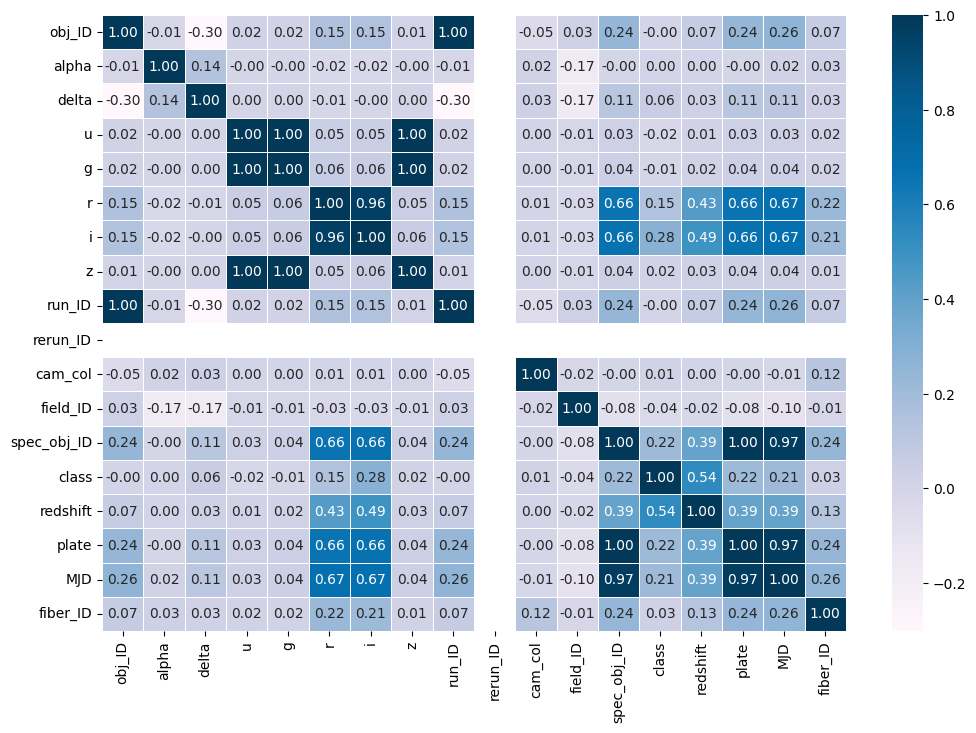

In [11]:
f,ax = plt.subplots(figsize=(12,8))
sns.heatmap(data.corr(), cmap="PuBu", annot=True, linewidths=0.5, fmt= '.2f',ax=ax)
plt.show()

## Обработка данных

Уберем выбросы с помощью LocalOutlierFactor

In [12]:
from sklearn.neighbors import LocalOutlierFactor
clf = LocalOutlierFactor()
y_pred = clf.fit_predict(data) 

In [13]:
x_score = clf.negative_outlier_factor_
outlier_score = pd.DataFrame()
outlier_score["score"] = x_score

#threshold
threshold2 = -1.5                                            
filtre2 = outlier_score["score"] < threshold2
outlier_index = outlier_score[filtre2].index.tolist()

In [14]:
len(outlier_index)

15256

In [15]:
data.drop(outlier_index, inplace=True)

Уберем признаки, у которых слишком низкая корреляция

In [16]:
corr = data.corr()
corr["class"].sort_values()

u             -0.222802
g             -0.058192
field_ID      -0.037542
run_ID         0.000250
obj_ID         0.000252
alpha          0.008187
cam_col        0.017789
fiber_ID       0.037319
delta          0.058947
r              0.160654
MJD            0.214433
spec_obj_ID    0.224718
plate          0.224718
i              0.294075
z              0.349711
redshift       0.541667
class          1.000000
rerun_ID            NaN
Name: class, dtype: float64

In [17]:
data = data.drop(['obj_ID','alpha','delta','run_ID','rerun_ID','cam_col','field_ID','fiber_ID'], axis = 1)

In [18]:
x = data.drop(['class'], axis = 1)
y = data.loc[:,'class'].values

Отмасштабируем данные с помощью StandardScaler

В машинном обучении StandardScaler (стандартный масштабатор) используется для изменения размера распределения значений так, чтобы среднее значение наблюдаемых значений было равно 0, а стандартное отклонение – 1.

In [19]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(x)
x = scaler.transform(x)

Разобьем данные на тренировочную и тестовую выборки

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.33, random_state = 42)

## Машинное обучение

### KNeighbors

In [21]:
from sklearn.neighbors import KNeighborsClassifier

accuracy_list_train = []
accuracy_list_test = []
for i in range(1, 10):
    KNN = KNeighborsClassifier(n_neighbors=i)
    KNN.fit(X_train, y_train)
    
    accuracy_train = round(KNN.score(X_train, y_train)*100, 4)
    accuracy_list_train.append(accuracy_train)
    
    accuracy_test = round(KNN.score(X_test, y_test)*100, 4)
    accuracy_list_test.append(accuracy_test)

Построим график Accuracy на тренировочкой выборке в зависимости от параметра соседей

Text(0, 0.5, 'Accuracy on train, %')

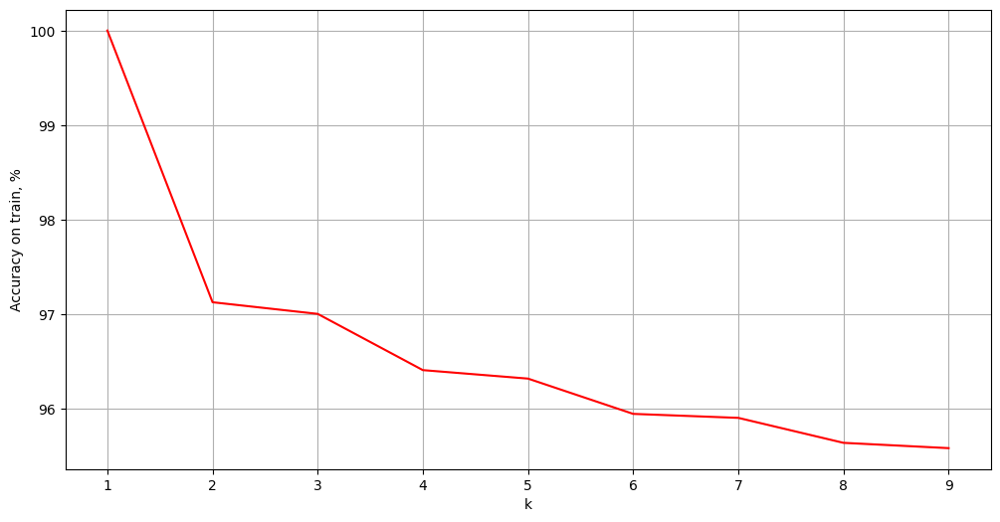

In [22]:
k = np.arange(1, 10)
plt.figure(figsize=(12, 6))
plt.plot(k, accuracy_list_train, 'red')
plt.xlabel('k')
plt.xticks(np.arange(min(k), max(k)+1, 1.0))
plt.grid(which='major')
plt.ylabel('Accuracy on train, %')

Построим график Accuracy на тестовой выборке

Text(0, 0.5, 'Accuracy on test, %')

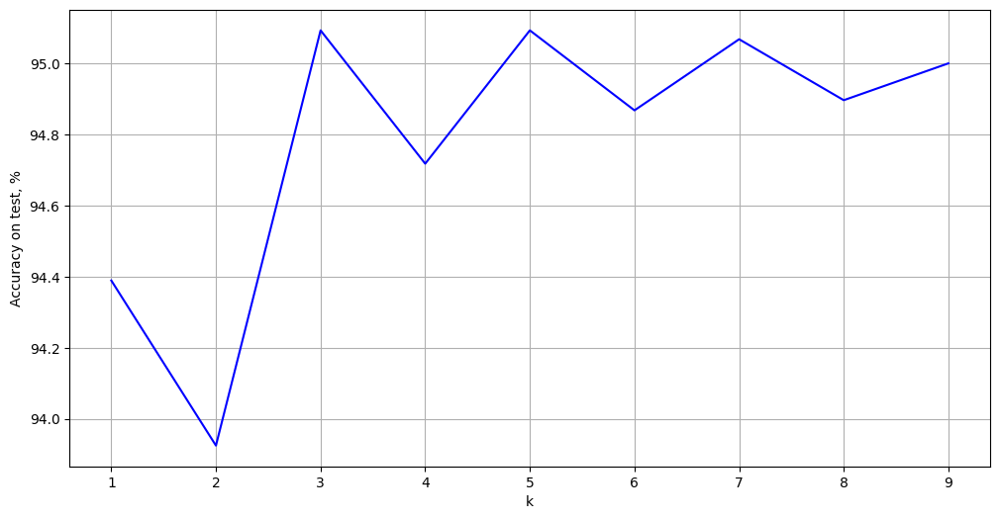

In [23]:
k = np.arange(1, 10)
plt.figure(figsize=(12, 6))
plt.plot(k, accuracy_list_test, 'blue')
plt.xlabel('k')
plt.xticks(np.arange(min(k), max(k)+1, 1.0))
plt.grid(which='major')
plt.ylabel('Accuracy on test, %')

Оптимальный параметр числа соседей - 3. Запустим классификатор с этим параметром и посмотрим на матрицу рассогласования

In [24]:
import time

KNN_model = KNeighborsClassifier(n_neighbors = 3).fit(X_train, y_train)

start_time = time.time()
error_train = 1 - KNN_model.score(X_train, y_train)
error_test = 1 - KNN_model.score(X_test, y_test)
end_time = time.time()
runtime = end_time - start_time

print('Error on train = ', error_train)
print('Error on test = ', error_test)
print('Runtime = ', runtime)

Error on train =  0.029994011765120288
Error on test =  0.04905957233783875
Runtime =  3.5051701068878174


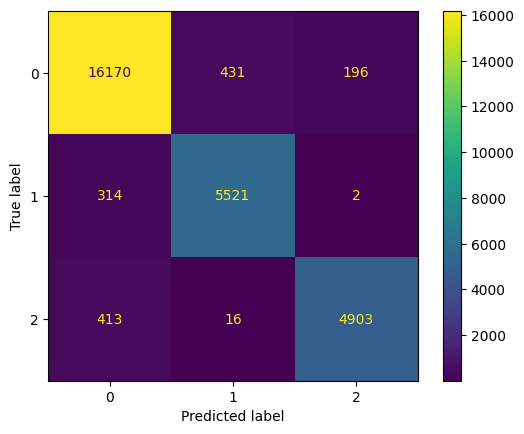

In [25]:
ConfusionMatrixDisplay.from_estimator(KNN_model, X_test, y_test)

- Ошибка на тренировочной выборке = 0.029
- Ошибка на тестовой выборке = 0.049

Классификатор с числом соседей 3 показывает неплохой результат

### RandomForest

In [26]:
from sklearn import ensemble
RF = ensemble.RandomForestClassifier(n_estimators = 100)

In [27]:
%%time
RF.fit(X_train, y_train)

CPU times: total: 13.6 s
Wall time: 13.7 s


RandomForestClassifier()

In [28]:
start_time = time.time()
error_train = np.mean(y_train != RF.predict(X_train))
error_test  = np.mean(y_test  != RF.predict(X_test))
end_time = time.time()
runtime = end_time - start_time

print('Error on train = ', error_train)
print('Error on test = ', error_test)
print('Runtime = ', runtime)

Error on train =  3.522491105709958e-05
Error on test =  0.019452191947364656
Runtime =  0.7937173843383789


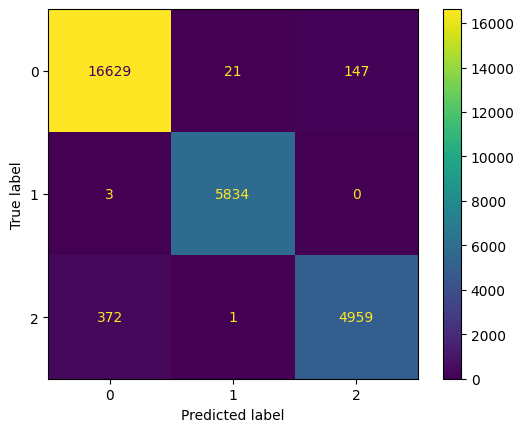

In [29]:
ConfusionMatrixDisplay.from_estimator(RF, X_test, y_test)

- Ошибка на тренировочной выборке = 0.00
- Ошибка на тестовой выборке = 0.02

### LogisticRegression

In [30]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression(solver="lbfgs", max_iter=500)

In [31]:
%%time
LR.fit(X_train, y_train)

CPU times: total: 1.62 s
Wall time: 734 ms


LogisticRegression(max_iter=500)

In [32]:
start_time = time.time()
error_train = np.mean(y_train != LR.predict(X_train))
error_test  = np.mean(y_test  != LR.predict(X_test))
end_time = time.time()
runtime = end_time - start_time

print('Error on train = ', error_train)
print('Error on test = ', error_test)
print('Runtime = ', runtime)

Error on train =  0.044083976187960124
Error on test =  0.04040620753772438
Runtime =  0.004004001617431641


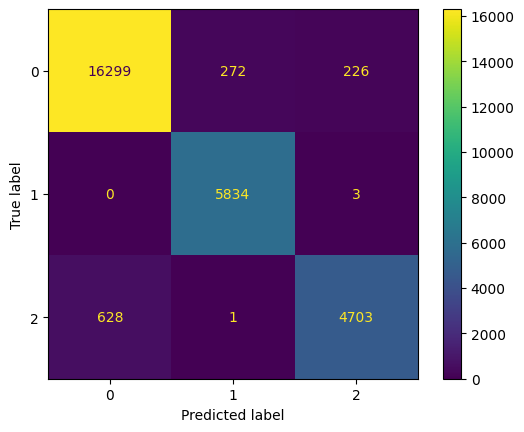

In [33]:
ConfusionMatrixDisplay.from_estimator(LR, X_test, y_test) 

- Ошибка на тренировочной выборке = 0.044
- Ошибка на тестовой выборке = 0.040

### MLP

In [34]:
from sklearn.neural_network import MLPClassifier
MLP = MLPClassifier(hidden_layer_sizes = (100,),
                          solver = 'lbfgs', 
                          activation = 'logistic',
                          random_state = 42)

In [35]:
%%time
MLP.fit(X_train, y_train)

CPU times: total: 2min 4s
Wall time: 1min 1s


C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:559: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



MLPClassifier(activation='logistic', random_state=42, solver='lbfgs')

In [36]:
start_time = time.time()
error_train = np.mean(y_train != MLP.predict(X_train))
error_test  = np.mean(y_test  != MLP.predict(X_test))
end_time = time.time()
runtime = end_time - start_time

print('Error on train = ', error_train)
print('Error on test = ', error_test)
print('Runtime = ', runtime)

Error on train =  0.026277783648596287
Error on test =  0.02653221769291282
Runtime =  0.35431957244873047


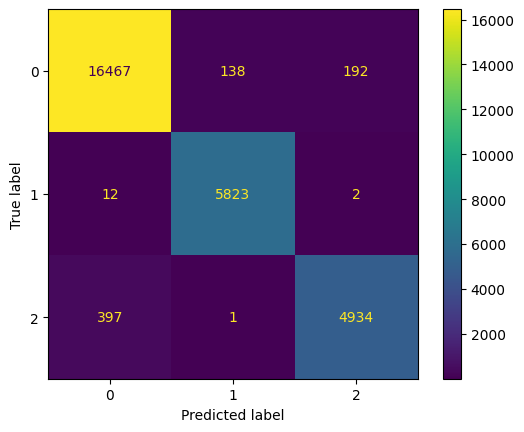

In [37]:
ConfusionMatrixDisplay.from_estimator(MLP, X_test, y_test) 

C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.



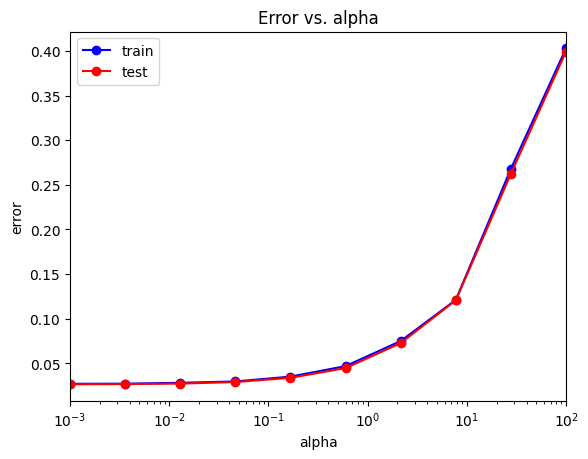

In [40]:
alpha_arr = np.logspace(-3, 2, 10)

train_err = []
test_err = []

for alpha in alpha_arr:
    MLP = MLPClassifier(alpha = alpha, hidden_layer_sizes = (100,), max_iter=100, random_state = 42)
    MLP.fit(X_train, y_train)

    y_train_pred = MLP.predict(X_train)
    y_test_pred = MLP.predict(X_test)
    
    train_err.append(np.mean(y_train != y_train_pred))
    test_err.append(np.mean(y_test != y_test_pred))

plt.semilogx(alpha_arr, train_err, 'b-o', label = 'train')
plt.semilogx(alpha_arr, test_err, 'r-o', label = 'test')
plt.xlim([np.min(alpha_arr), np.max(alpha_arr)])
plt.title('Error vs. alpha')
plt.xlabel('alpha')
plt.ylabel('error')
plt.legend()

In [41]:
min_train_err = np.min(train_err)
min_test_err = np.min(test_err)
print('Min error on train = ', min_train_err)
print('Min error on test = ', min_test_err)

Min error on train =  0.02691183204762408
Min error on test =  0.026317671458199243


In [42]:
alpha_opt = alpha_arr[test_err == min_test_err]
print('Optimal alpha = ', alpha_opt)

Optimal alpha =  [0.001]


C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\nick\AppData\Roaming\Python\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

C:\Users\nick\AppData\Roaming\Python\Python310\site-packages

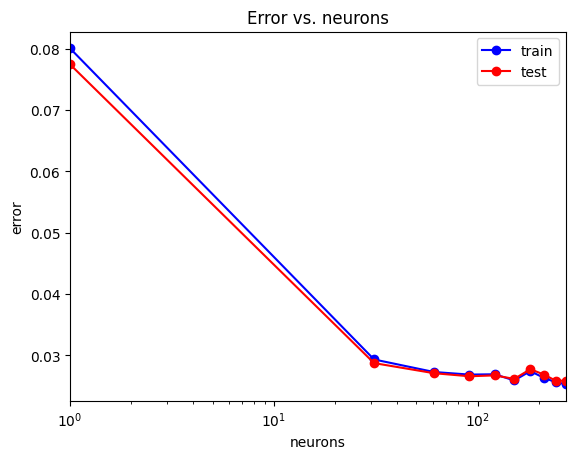

In [43]:
neurons_num = np.array([i for i in range(1, 300, 30)])

train_err = []
test_err = []

for neurons in neurons_num:
    MLP = MLPClassifier(alpha = alpha_opt[0], hidden_layer_sizes = (neurons,), max_iter=100, random_state = 42)
    MLP.fit(X_train, y_train)

    y_train_pred = MLP.predict(X_train)
    y_test_pred = MLP.predict(X_test)
    
    train_err.append(np.mean(y_train != y_train_pred))
    test_err.append(np.mean(y_test != y_test_pred))

plt.semilogx(neurons_num, train_err, 'b-o', label = 'train')
plt.semilogx(neurons_num, test_err, 'r-o', label = 'test')
plt.xlim([np.min(neurons_num), np.max(neurons_num)])
plt.title('Error vs. neurons')
plt.xlabel('neurons')
plt.ylabel('error')
plt.legend()

In [44]:
min_train_err = np.min(train_err)
min_test_err = np.min(test_err)
print('Min error on train = ', min_train_err)
print('Min error on test = ', min_test_err)

Min error on train =  0.0252914861389975
Min error on test =  0.02588857898877208


In [45]:
neurons_num_opt = neurons_num[test_err == min_test_err]
print('Optimal number of neurons = ', neurons_num_opt)

Optimal number of neurons =  [241 271]


In [50]:
MLP = MLPClassifier(alpha = alpha_opt[0], hidden_layer_sizes = (neurons_num_opt[0],), random_state = 42)

In [51]:
%%time
MLP.fit(X_train, y_train)

CPU times: total: 1min 5s
Wall time: 33.3 s


MLPClassifier(alpha=0.001, hidden_layer_sizes=(241,), random_state=42)

In [55]:
error_train = np.mean(y_train != MLP.predict(X_train))
error_test  = np.mean(y_test  != MLP.predict(X_test))

print('Error on train =', error_train)
print('Error on test =', error_test)

Error on train = 0.026665257670224384
Error on test = 0.026854037044983195


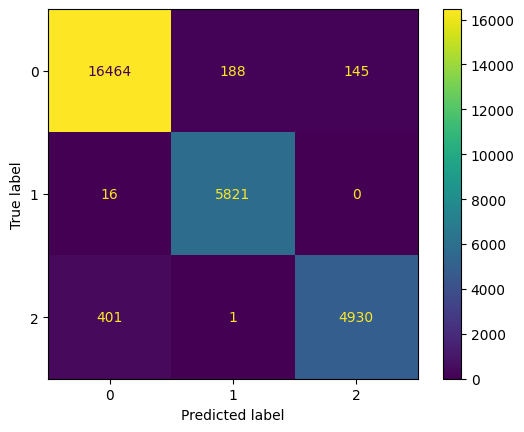

In [53]:
ConfusionMatrixDisplay.from_estimator(MLP, X_test, y_test)